# IMPORT LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
sns.set(style = 'darkgrid')
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# IMPORT DATASET

In [2]:
data = pd.read_csv(r"C:\Users\Sahil-pc\Downloads\supermarket data1.csv")
data

,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,A,Yangon,Member,Female,Health and beauty,74.69,7.0,26.1415,548.9715,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5.0,3.8200,80.2200,10:29,Cash,76.40,4.761905,3.8200,9.6
2,A,Yangon,Normal,Male,Home and lifestyle,46.33,7.0,16.2155,340.5255,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,A,Yangon,Member,Male,Health and beauty,58.22,8.0,23.2880,489.0480,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,A,Yangon,Normal,Male,Sports and travel,86.31,7.0,30.2085,634.3785,10:37,Ewallet,604.17,4.761905,30.2085,5.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# EXPLORATROY DATA ANALYSIS

In [3]:
column = ['Tax 5%', 'cogs', 'gross margin percentage','City']

In [4]:
data.drop(columns = column, inplace =True)

In [5]:
data.head(5)

,Branch,Customer type,Gender,Product line,Unit price,Quantity,Total,Time,Payment,gross income,Rating
0,A,Member,Female,Health and beauty,74.69,7.0,548.9715,13:08,Ewallet,26.1415,9.1
1,C,Normal,Female,Electronic accessories,15.28,5.0,80.2200,10:29,Cash,3.8200,9.6
2,A,Normal,Male,Home and lifestyle,46.33,7.0,340.5255,13:23,Credit card,16.2155,7.4
3,A,Member,Male,Health and beauty,58.22,8.0,489.0480,20:33,Ewallet,23.2880,8.4
4,A,Normal,Male,Sports and travel,86.31,7.0,634.3785,10:37,Ewallet,30.2085,5.3


In [6]:
data.tail(5)

,Branch,Customer type,Gender,Product line,Unit price,Quantity,Total,Time,Payment,gross income,Rating
1004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.39,NaN,NaN


In [7]:
data.shape

(1009, 11)

In [8]:
data.dtypes

Branch            object
Customer type     object
Gender            object
Product line      object
Unit price       float64
Quantity         float64
Total            float64
Time              object
Payment           object
gross income     float64
Rating           float64
dtype: object

In [9]:
data.describe()

,Unit price,Quantity,Total,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,55.672130,5.510000,322.966749,15.379369,6.97270
std,26.494628,2.923431,245.885335,11.708825,1.71858
min,10.080000,1.000000,10.678500,0.508500,4.00000
25%,32.875000,3.000000,124.422375,5.924875,5.50000
50%,55.230000,5.000000,253.848000,12.088000,7.00000
75%,77.935000,8.000000,471.350250,22.445250,8.50000
max,99.960000,10.000000,1042.650000,49.650000,10.00000


In [10]:
data.describe(include = object)

,Branch,Customer type,Gender,Product line,Time,Payment
count,1000,1000,1000,1000,1000,1001
unique,3,2,2,6,506,4
top,A,Member,Female,Fashion accessories,19:48,Ewallet
freq,340,501,501,178,7,345


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1009 entries, 0 to 1008
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Branch         1000 non-null   object 
 1   Customer type  1000 non-null   object 
 2   Gender         1000 non-null   object 
 3   Product line   1000 non-null   object 
 4   Unit price     1000 non-null   float64
 5   Quantity       1000 non-null   float64
 6   Total          1000 non-null   float64
 7   Time           1000 non-null   object 
 8   Payment        1001 non-null   object 
 9   gross income   1000 non-null   float64
 10  Rating         1000 non-null   float64
dtypes: float64(5), object(6)
memory usage: 86.8+ KB


In [12]:
data['Time'] = pd.to_datetime(data['Time'])
data['Hour'] = (data['Time']).dt.hour    #type(sales['Time'])

In [13]:
data.duplicated().sum()

7

In [14]:
data.drop_duplicates(inplace = True)

In [15]:
data.duplicated().sum()

0

In [16]:
data.isnull().sum()

Branch           2
Customer type    2
Gender           2
Product line     2
Unit price       2
Quantity         2
Total            2
Time             2
Payment          1
gross income     2
Rating           2
Hour             2
dtype: int64

In [17]:
#calculate the missing values for each column
for i in data.isnull().sum():
    print(i/len(data) *100)

0.19960079840319359
0.19960079840319359
0.19960079840319359
0.19960079840319359
0.19960079840319359
0.19960079840319359
0.19960079840319359
0.19960079840319359
0.09980039920159679
0.19960079840319359
0.19960079840319359
0.19960079840319359


In [18]:
data.columns

Index(['Branch', 'Customer type', 'Gender', 'Product line', 'Unit price',
       'Quantity', 'Total', 'Time', 'Payment', 'gross income', 'Rating',
       'Hour'],
      dtype='object')

In [19]:
data = data.dropna(subset=['Branch',  'Gender', 'Product line', 'Unit price', 'Quantity',
       'Total', 'Payment', 'gross income', 'Rating'])

In [20]:
data.isnull().sum()

Branch           0
Customer type    0
Gender           0
Product line     0
Unit price       0
Quantity         0
Total            0
Time             0
Payment          0
gross income     0
Rating           0
Hour             0
dtype: int64

# DATA VISUALISATION 

In [21]:
#Heatmap
#Null value

<AxesSubplot:>

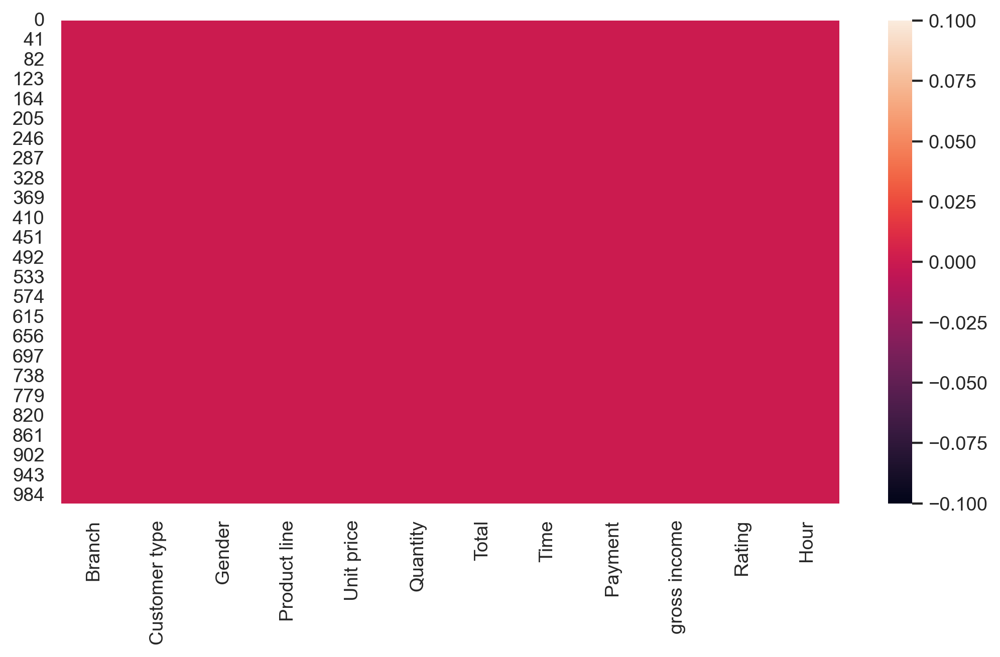

In [22]:
sns.heatmap(data.isnull())

In [23]:
#Correlation

In [24]:
data.corr()

,Unit price,Quantity,Total,gross income,Rating,Hour
Unit price,1.000000,0.010778,0.633962,0.633962,-0.008778,0.008242
Quantity,0.010778,1.000000,0.705510,0.705510,-0.015815,-0.007317
Total,0.633962,0.705510,1.000000,1.000000,-0.036442,-0.002770
gross income,0.633962,0.705510,1.000000,1.000000,-0.036442,-0.002770
Rating,-0.008778,-0.015815,-0.036442,-0.036442,1.000000,-0.030588
Hour,0.008242,-0.007317,-0.002770,-0.002770,-0.030588,1.000000


Text(0.5, 1.0, 'Correlation Heatmap')

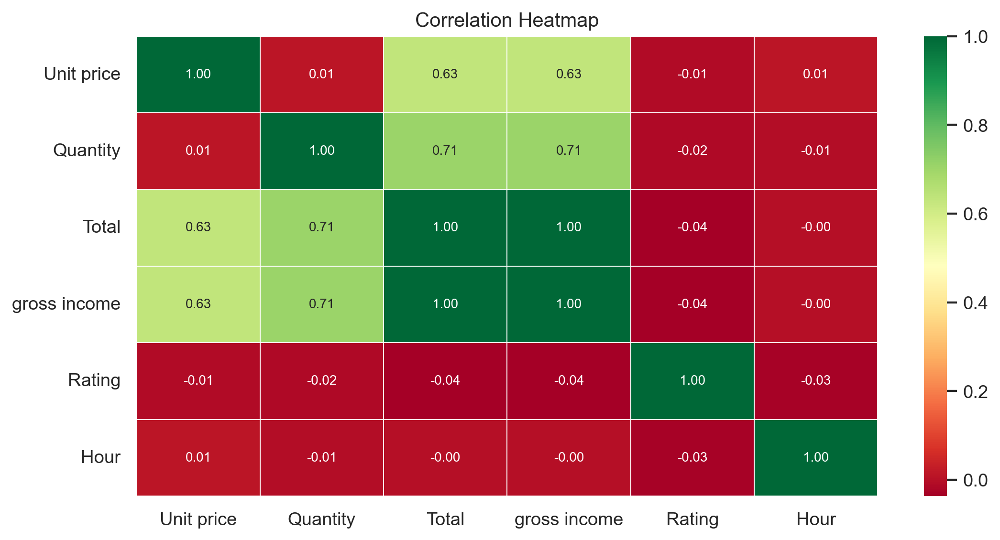

In [25]:
sns.heatmap(data.corr(), annot=True,cmap = 'RdYlGn', fmt=".2f",linewidths=0.5, annot_kws={"size": 8})
plt.title('Correlation Heatmap')

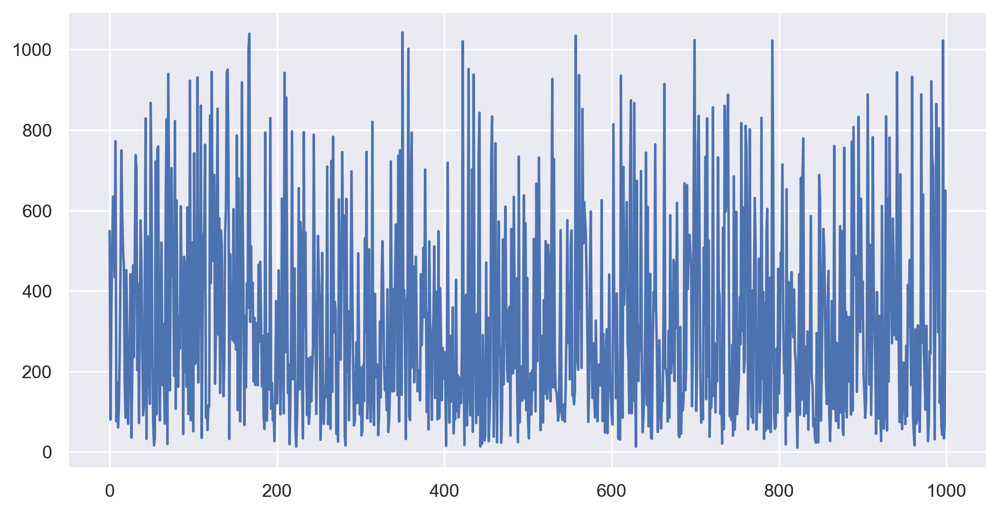

In [26]:
plt.plot(data['Total'])
plt.show()

In [27]:
#Histogram

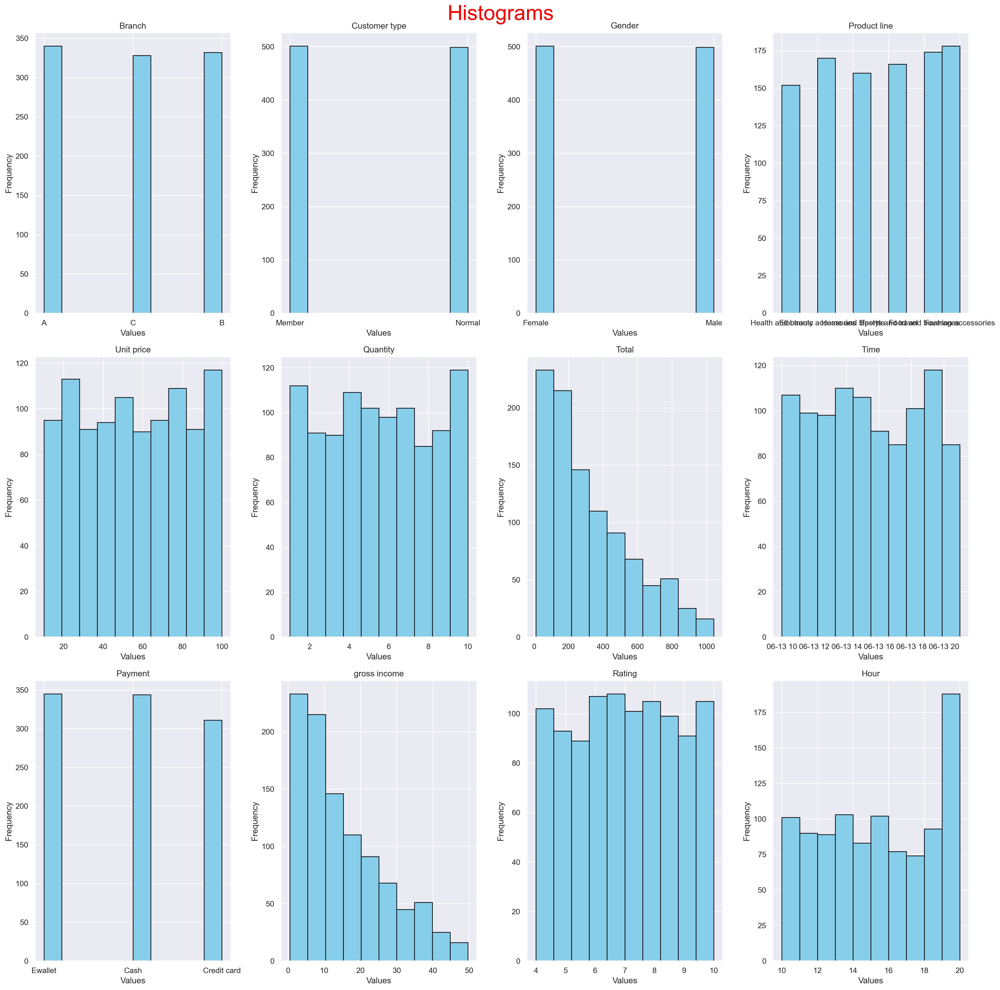

In [31]:
data = pd.DataFrame(data)

# Set up the figure and axis
fig, axs = plt.subplots(3, 4, figsize=(20, 20))
fig.suptitle('Histograms', fontsize = 30, color = 'red')

# Flatten the axis array for easy iteration
axs = axs.flatten()

# Iterate through each column and plot histogram
for i, column in enumerate(data.columns):
    axs[i].hist(data[column], bins=10, color='skyblue', edgecolor='black')
    axs[i].set_title(column)
    axs[i].set_xlabel('Values')
    axs[i].set_ylabel('Frequency')

# Hide any unused subplots
for j in range(len(data.columns), len(axs)):
    axs[j].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

In [32]:
#Boxplot

# outlier detection

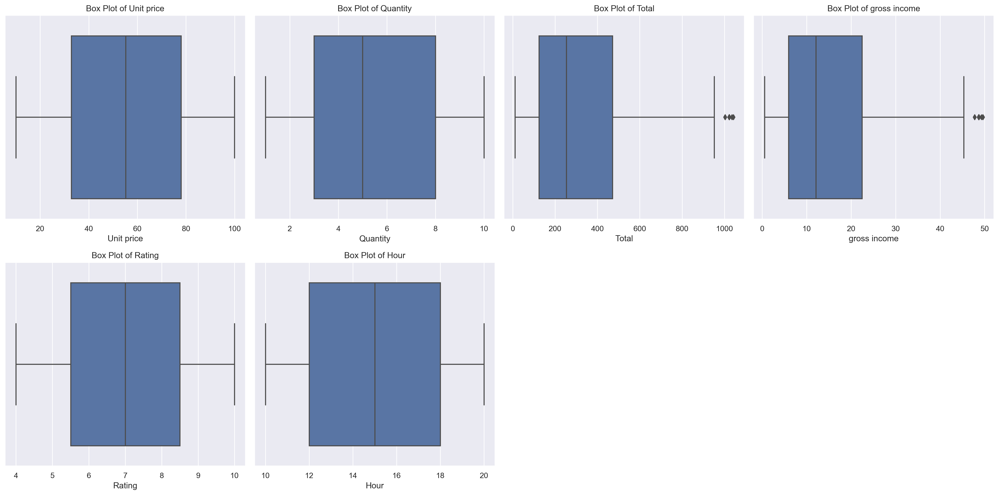

In [33]:
# Get the numerical column names
numerical_columns = data.select_dtypes(include=['int', 'float']).columns.tolist()

# Calculate the number of rows and columns for subplots
num_plots = len(numerical_columns)
num_rows = (num_plots - 1) // 4 + 1
num_cols = min(num_plots, 4)

# Create box plots for multiple numerical columns
plt.figure(figsize=(5 * num_cols, 5 * num_rows))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=data, x=column)
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)
plt.tight_layout()

In [34]:
columns = ['Total', 'gross income']

In [35]:
def outlier_detection(data,colname):
    for col in colname:
        q1 = data[col].quantile(0.25)
        q3 = data[col].quantile(0.75)
        iqr = q3-q1
    
        upper = q3+(1.5*iqr)
        lower = q1-(1.5*iqr)
    
        data[col]=np.where(data[col]> upper,upper,np.where(data[col]< lower,lower,data[col]))

In [36]:
outlier_detection(data, columns)

# After Removing Outlier

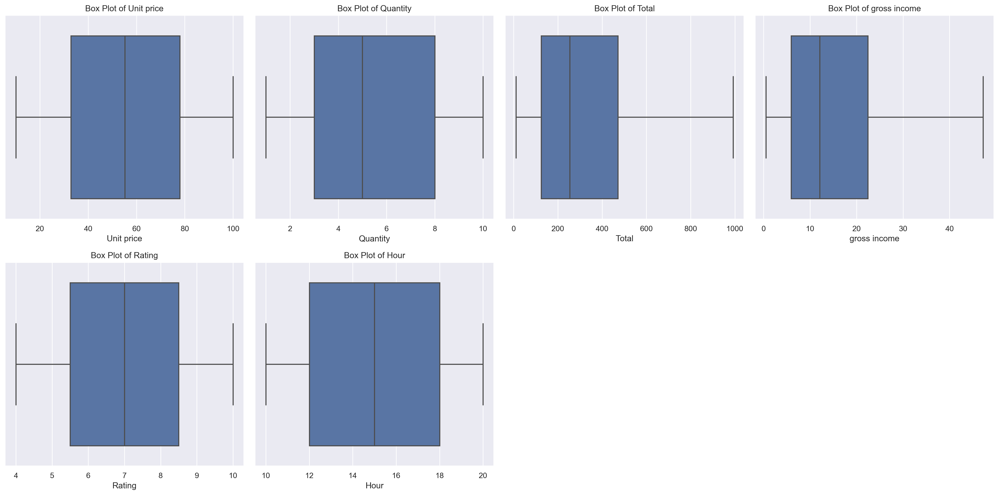

In [37]:
# Get the numerical column names
numerical_columns = data.select_dtypes(include=['int', 'float']).columns.tolist()

# Calculate the number of rows and columns for subplots
num_plots = len(numerical_columns)
num_rows = (num_plots - 1) // 4 + 1
num_cols = min(num_plots, 4)

# Create box plots for multiple numerical columns
plt.figure(figsize=(5 * num_cols, 5 * num_rows))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=data, x=column)
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)
plt.tight_layout()

In [38]:
#countplot

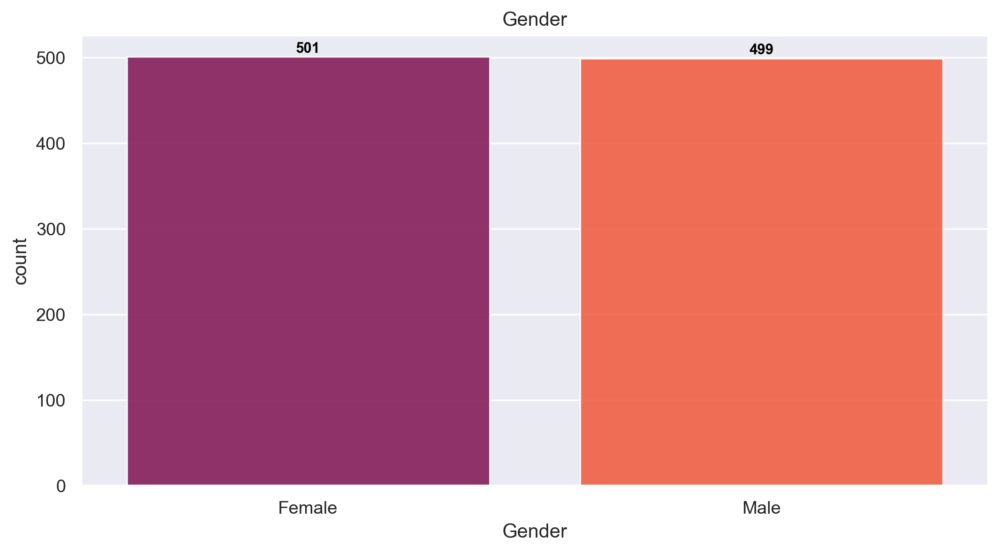

In [39]:
sns.set(style='darkgrid')

ax = sns.countplot(data=data, x='Gender', saturation=1, alpha=0.9, palette='rocket', 
                   order=data['Gender'].value_counts().index)

ax.set_title('Gender')

for p in ax.patches:
    
    number = '{}'.format(p.get_height().astype('int64'))
    
    ax.annotate(number, (p.get_x() + p.get_width()/2., p.get_height()), ha='center', va='center',
    xytext=(0,5), textcoords='offset points', color='black', fontweight='semibold', fontsize=9)

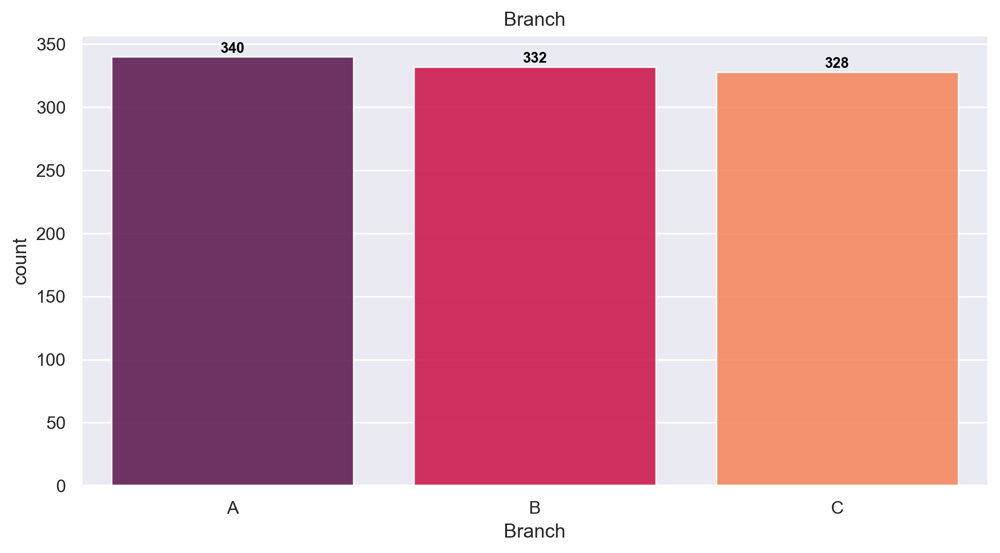

In [40]:
sns.set(style='darkgrid')

ax = sns.countplot(data=data, x='Branch', saturation=1, alpha=0.9, palette='rocket', 
                   order=data['Branch'].value_counts().index)

ax.set_title('Branch')

for p in ax.patches:
    
    number = '{}'.format(p.get_height().astype('int64'))
    
    ax.annotate(number, (p.get_x() + p.get_width()/2., p.get_height()), ha='center', va='center',
    xytext=(0,5), textcoords='offset points', color='black', fontweight='semibold', fontsize=9)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Fashion accessories'),
  Text(1, 0, 'Food and beverages'),
  Text(2, 0, 'Electronic accessories'),
  Text(3, 0, 'Sports and travel'),
  Text(4, 0, 'Home and lifestyle'),
  Text(5, 0, 'Health and beauty')])

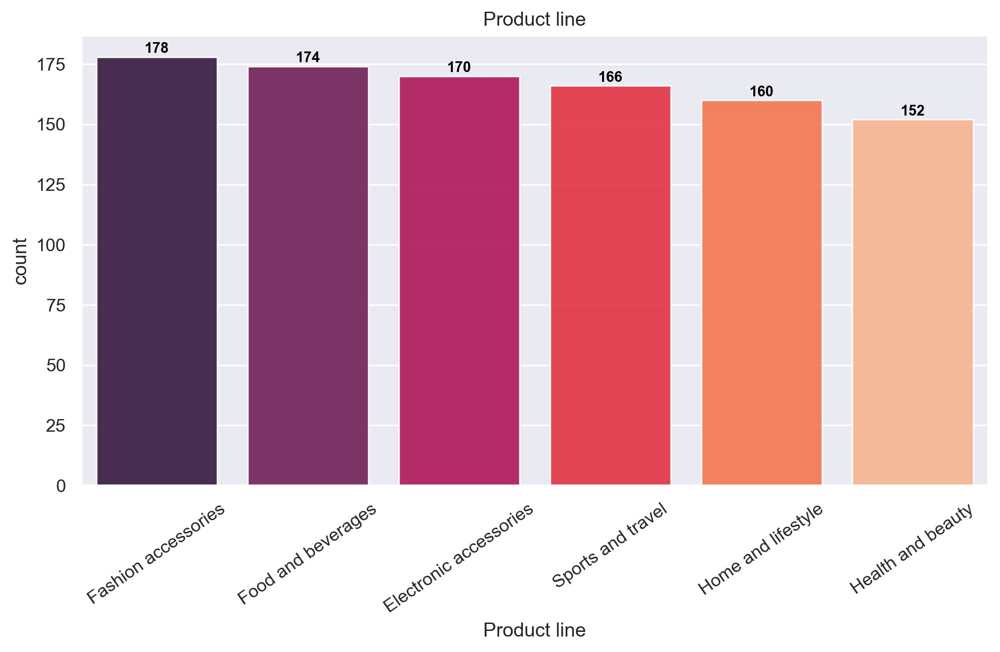

In [41]:
sns.set(style='darkgrid')

ax = sns.countplot(data=data, x='Product line', saturation=1, alpha=0.9, palette='rocket', 
                   order=data['Product line'].value_counts().index)

ax.set_title('Product line')

for p in ax.patches:
    
    number = '{}'.format(p.get_height().astype('int64'))
    
    ax.annotate(number, (p.get_x() + p.get_width()/2., p.get_height()), ha='center', va='center',
    xytext=(0,5), textcoords='offset points', color='black', fontweight='semibold', fontsize=9)
plt.xticks(rotation=35)  

In [42]:
#scatterplot

<AxesSubplot:xlabel='Total', ylabel='gross income'>

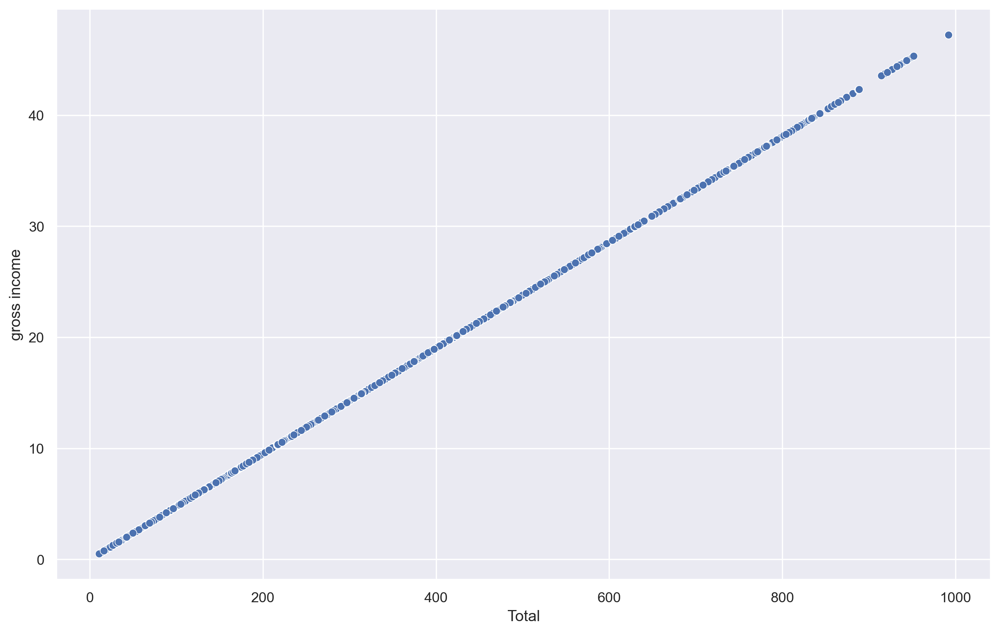

In [43]:
plt.figure(figsize=(13,8))
sns.scatterplot(x = data['Total'], y =data['gross income'])

<AxesSubplot:xlabel='Quantity', ylabel='Unit price'>

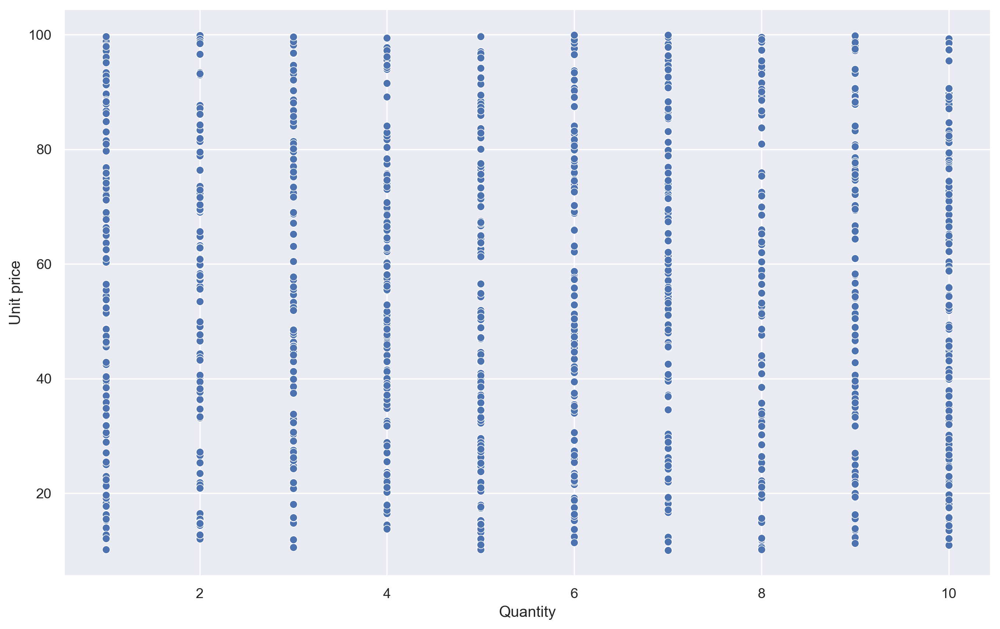

In [44]:
plt.figure(figsize=(13,8))
sns.scatterplot(x = data['Quantity'], y =data['Unit price'])

In [45]:
#Barplot

<AxesSubplot:xlabel='Branch', ylabel='Total'>

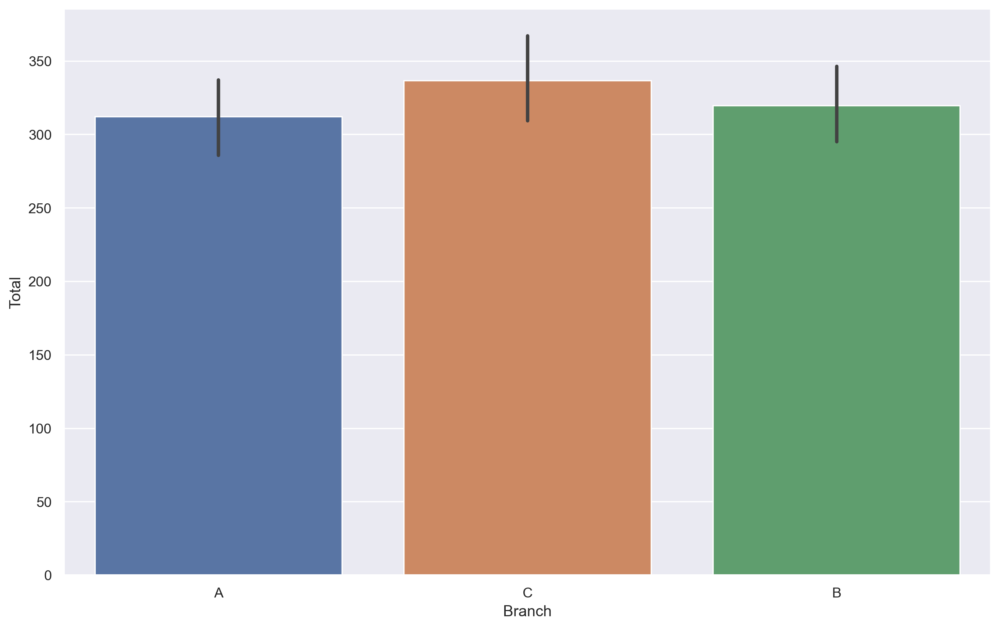

In [46]:
plt.figure(figsize=(13,8))
sns.barplot(x = data['Branch'], y =data['Total'])

<AxesSubplot:xlabel='Customer type', ylabel='Total'>

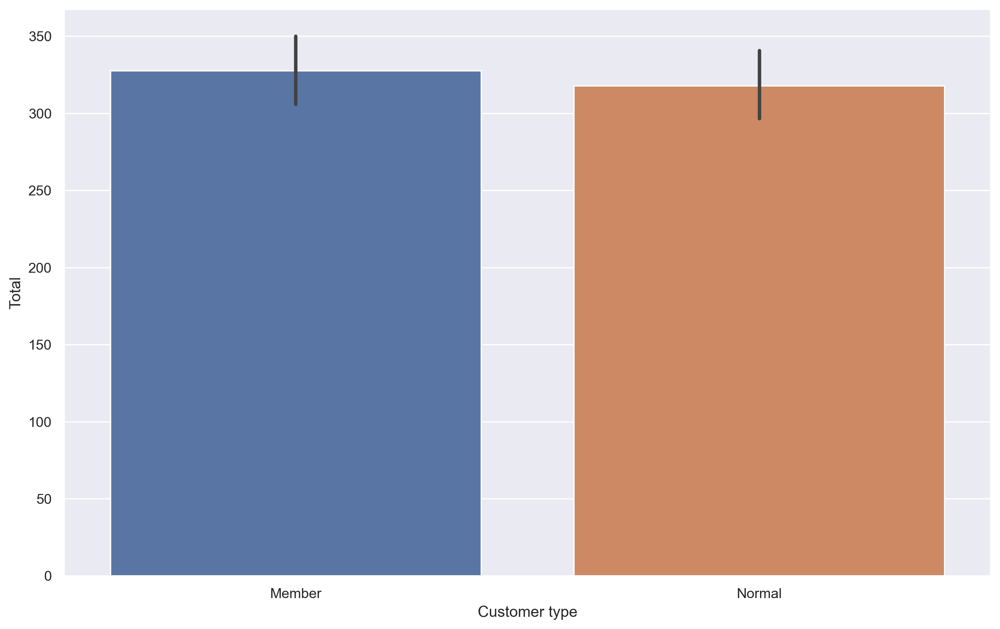

In [57]:
plt.figure(figsize=(13,8))
sns.barplot(x = data['Customer type'], y =data['Total'])

<AxesSubplot:xlabel='Rating', ylabel='Product line'>

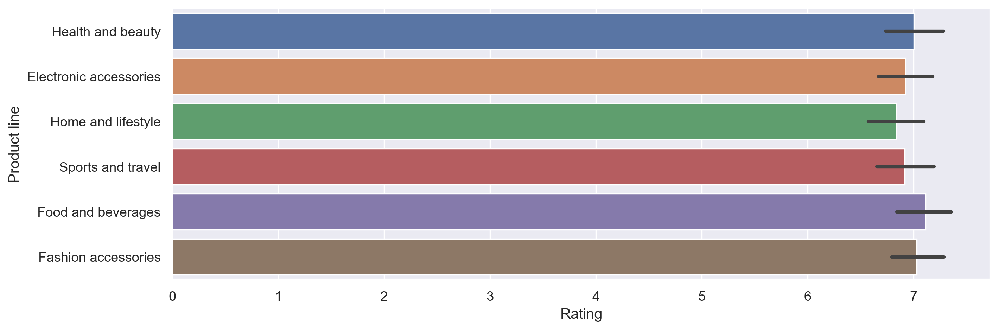

In [47]:
plt.figure(figsize=(12,4))
sns.barplot(y = data['Product line'], x = data['Rating'])

<AxesSubplot:xlabel='Payment', ylabel='count'>

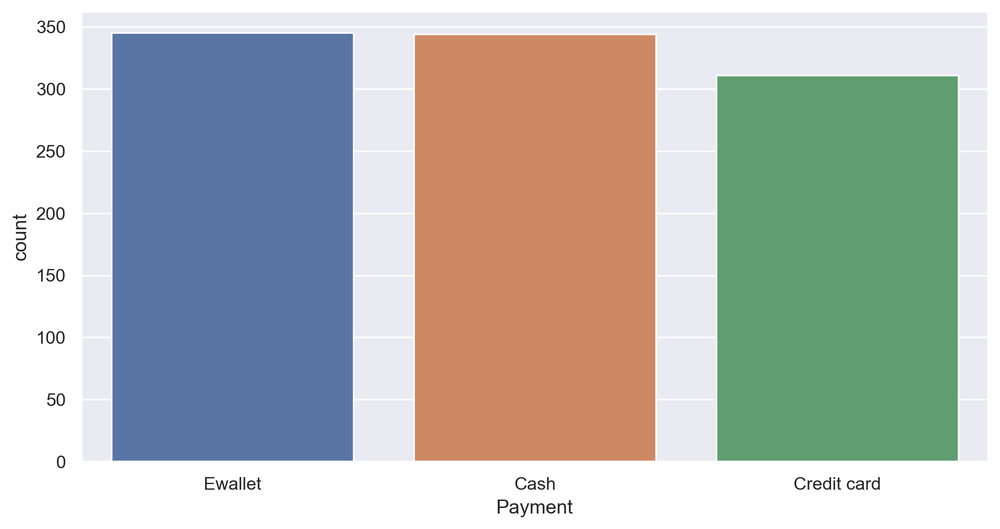

In [48]:
plt.figure(figsize=(10,5))
sns.countplot(data['Payment'])

Text(0.5, 1.0, 'Payment by Branch')

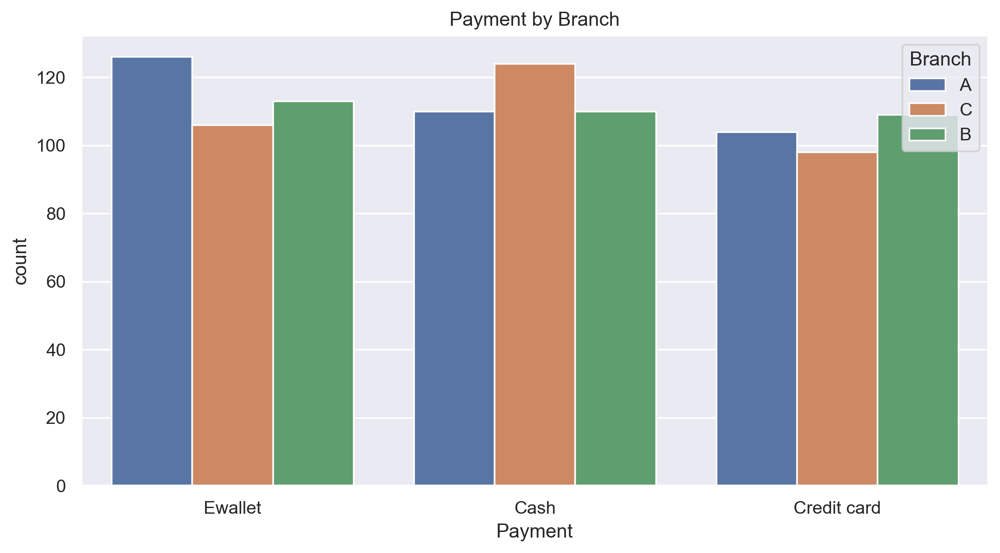

In [49]:
sns.countplot(x="Payment", hue = "Branch", data =data).set_title("Payment by Branch") 

In [50]:
#Pairplot

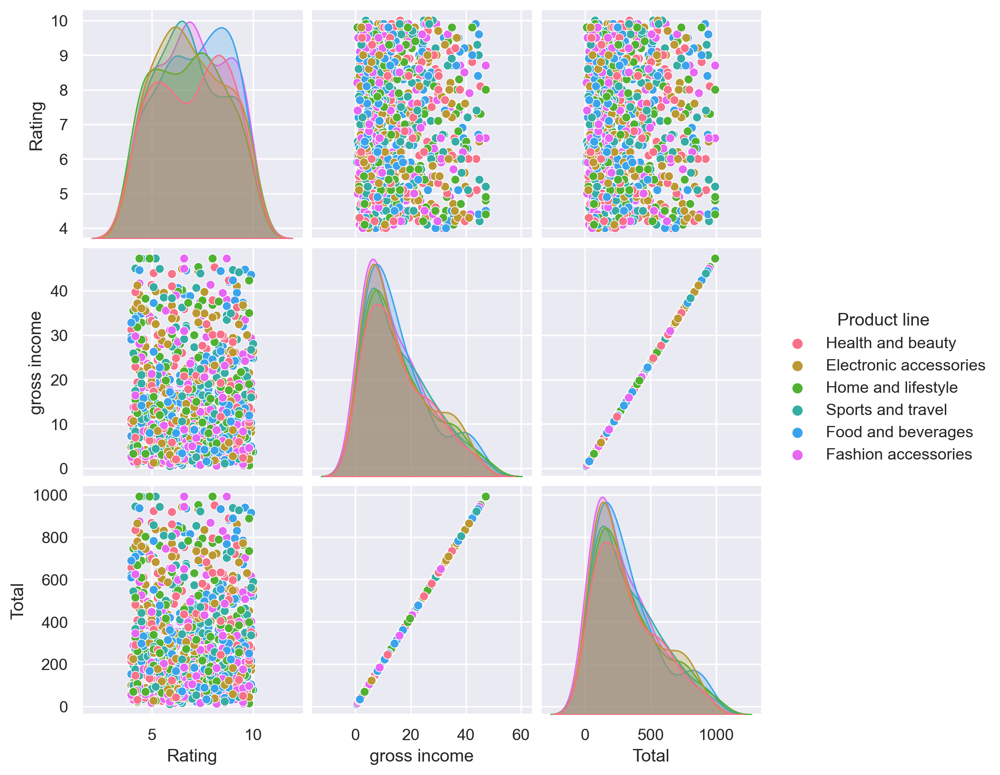

In [51]:
sns.pairplot(data , vars=['Rating','gross income','Total'] , hue='Product line', palette='husl')

In [52]:
#Quantity purchase by product

<AxesSubplot:xlabel='Quantity', ylabel='Product line'>

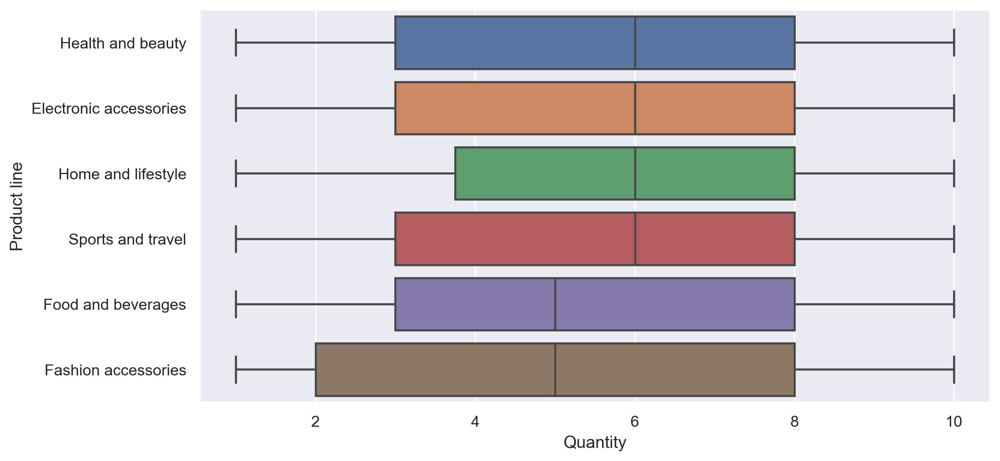

In [53]:
sns.boxplot(x= 'Quantity', y = 'Product line', data= data)

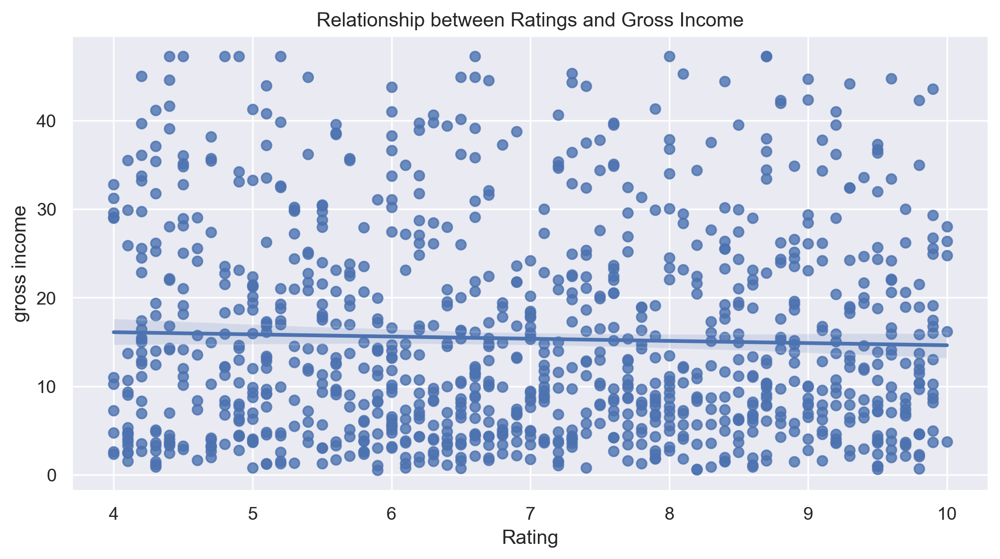

In [54]:
sns.regplot(x = data['Rating'], y = data['gross income'])

plt.title('Relationship between Ratings and Gross Income')
plt.show()

<Figure size 3250x2000 with 0 Axes>

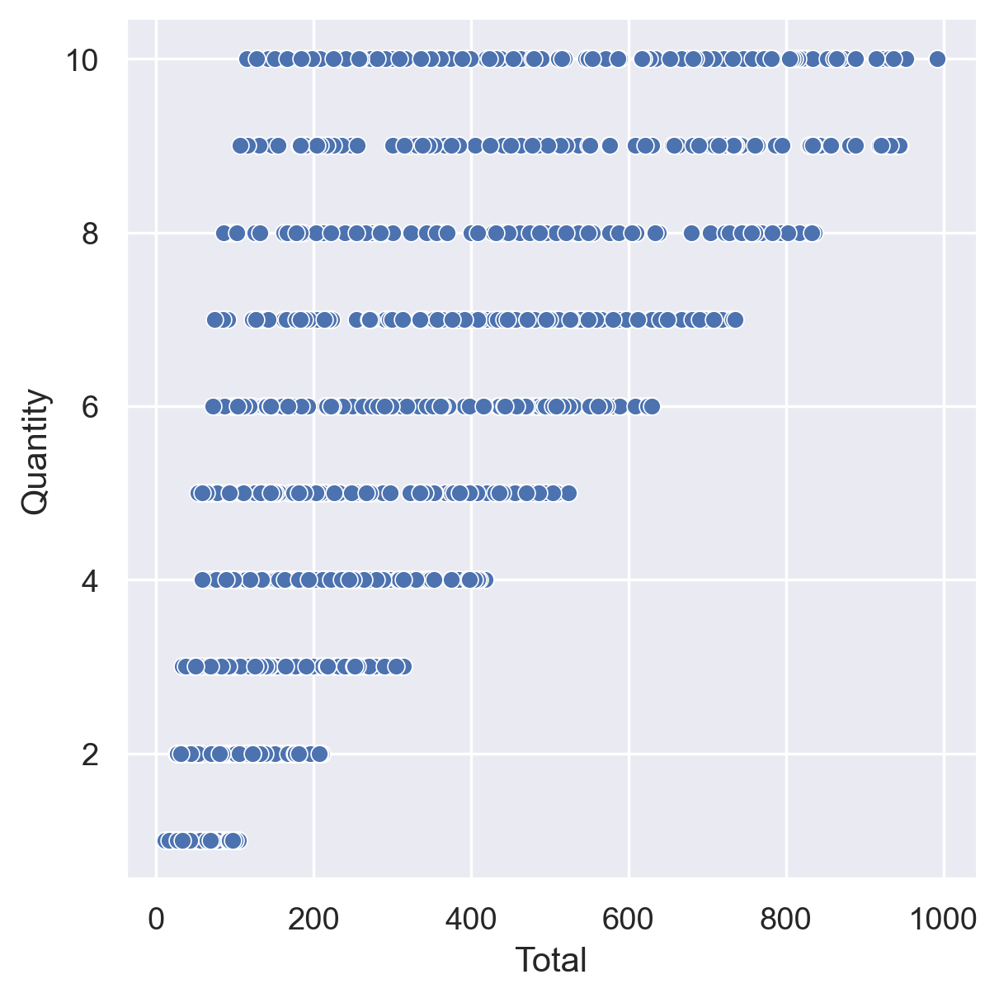

In [55]:
plt.figure(figsize=(13,8))
sns.relplot(x="Total",  y = "Quantity", data =data)

<AxesSubplot:xlabel='Total', ylabel='Product line'>

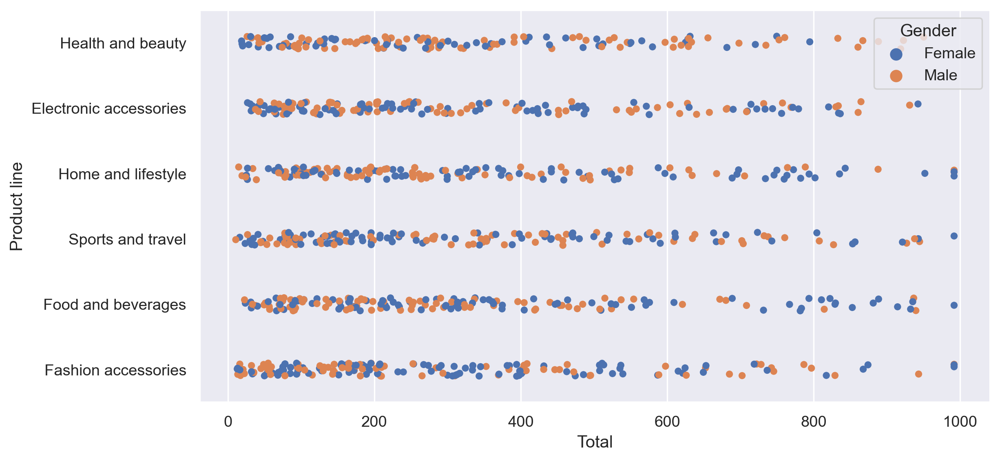

In [56]:
sns.stripplot(y = 'Product line', x = 'Total', hue = 'Gender', data=data )

Text(0.5, 1.0, 'Product Sales per Hour')

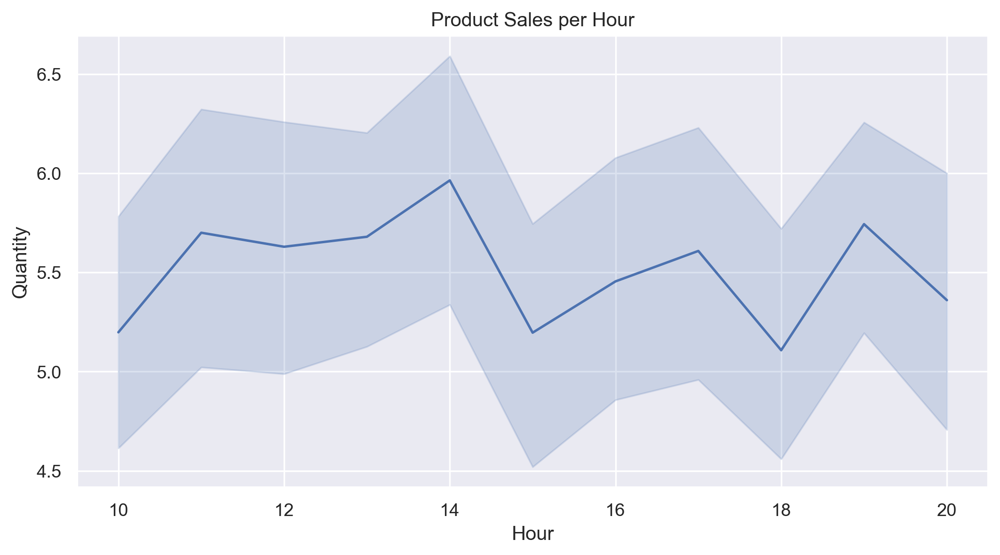

In [58]:
sns.lineplot(x="Hour",  y = 'Quantity',data =data).set_title("Product Sales per Hour")

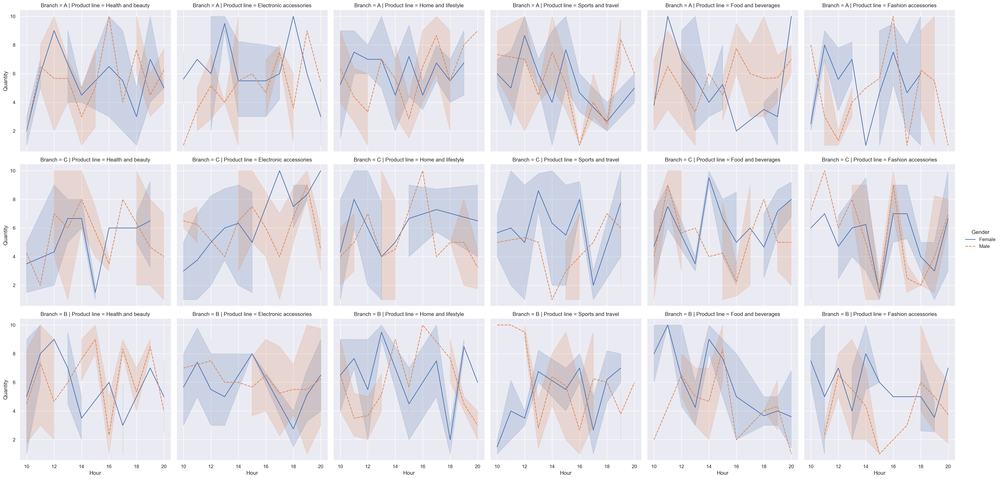

In [59]:
sns.relplot(x="Hour",  y = 'Quantity', col= 'Product line' , row= 'Branch', kind="line", hue="Gender", style="Gender", data =data)